<a href="https://colab.research.google.com/github/igorgad/covid-ts-br/blob/master/Clustered.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CoVID19 Time Series Modeling - MAE Dense with Pre-Clustering

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import cufflinks as cf
import plotly.offline as py
import plotly.graph_objs as go
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

from google.colab import drive
drive.mount('/content/drive')
!cp /content/drive/My\ Drive/Colab\ Notebooks/COVID19/BrazilData/clusters_all.csv .

!wget https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-json/dpc-covid19-ita-regioni.json
!wget https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv
!wget https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv
!wget https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv

# !pip install selenium
# !apt-get update
# !apt install chromium-chromedriver
# # !cp /usr/lib/chromium-browser/chromedriver /usr/bin

# import sys
# sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')
# from selenium import webdriver
# chrome_options = webdriver.ChromeOptions()
# chrome_options.add_argument('--headless')
# chrome_options.add_argument('--no-sandbox')
# chrome_options.add_argument('--disable-dev-shm-usage')
# driver = webdriver.Chrome('chromedriver', options=chrome_options)
# driver.get('https://covid.saude.gov.br')

# download_button = driver.find_elements_by_xpath("/html/body/app-root/ion-app/ion-router-outlet/app-home/ion-content/div[1]/div[2]/ion-button")[0]
# download_button.click()

# !pip install keras-rectified-adam

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
--2020-05-22 00:22:57--  https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-json/dpc-covid19-ita-regioni.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1193687 (1.1M) [text/plain]
Saving to: ‘dpc-covid19-ita-regioni.json.1’

dpc-covid19-ita-reg 100%[===================>]   1.14M  --.-KB/s    in 0.1s    

2020-05-22 00:22:57 (7.85 MB/s) - ‘dpc-covid19-ita-regioni.json.1’ saved [1193687/1193687]

--2020-05-22 00:22:59--  https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv
Resolving raw.githubusercontent.com (raw.githubuserc

# Loading Data

## Loading WHO Data


In [ ]:
df = pd.read_csv('time_series_covid19_confirmed_global.csv')
# Replace unkown province/state with the country name
df['Province/State'] = df['Country/Region'] + ':' + df['Province/State']
df.fillna({'Province/State': df['Country/Region']}, inplace=True)
who_df = df.iloc[:, 4:].T.astype(np.float32)
who_df.columns = df['Province/State']
who_df.index = pd.to_datetime(who_df.index).date
who_df.head()

Province/State,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia:Australian Capital Territory,Australia:New South Wales,Australia:Northern Territory,Australia:Queensland,Australia:South Australia,Australia:Tasmania,Australia:Victoria,Australia:Western Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Brazil,Brunei,Bulgaria,Burkina Faso,Cabo Verde,Cambodia,Cameroon,Canada:Alberta,Canada:British Columbia,Canada:Grand Princess,Canada:Manitoba,Canada:New Brunswick,...,Uzbekistan,Venezuela,Vietnam,Zambia,Zimbabwe,Canada:Diamond Princess,Dominica,Grenada,Mozambique,Syria,Timor-Leste,Belize,Laos,Libya,West Bank and Gaza,Guinea-Bissau,Mali,Saint Kitts and Nevis,Canada:Northwest Territories,Canada:Yukon,Kosovo,Burma,United Kingdom:Anguilla,United Kingdom:British Virgin Islands,United Kingdom:Turks and Caicos Islands,MS Zaandam,Botswana,Burundi,Sierra Leone,"Netherlands:Bonaire, Sint Eustatius and Saba",Malawi,United Kingdom:Falkland Islands (Malvinas),France:Saint Pierre and Miquelon,South Sudan,Western Sahara,Sao Tome and Principe,Yemen,Comoros,Tajikistan,Lesotho
2020-01-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


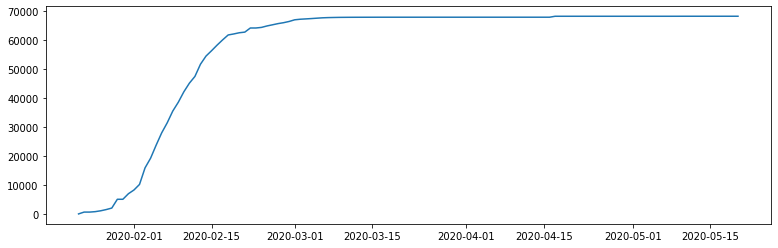

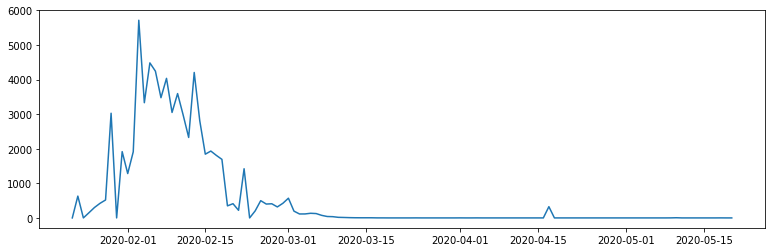

In [ ]:
def fix_hubei_data(sub_data):
    index = np.where(who_df['China:Hubei'].index == pd.to_datetime('2020-02-12'))[0][0] + 1
    # Shift data one day to the future
    sub_data.iloc[:index] = np.concatenate([np.zeros([1,]), sub_data.iloc[:index-1].values])

    # Apply parameter to normalize lab tested cases and clinical + lab tested cases
    sub_data.iloc[:index] = sub_data.iloc[:index] * (1 + 15384 / 36602)
    sub_data.iloc[index] = sub_data.iloc[index] * (0.65 + 15384 / 36602)

    return sub_data

# Fix Hubei data
if 'China:Hubei' in who_df.columns:
    who_df['China:Hubei'] = fix_hubei_data(who_df['China:Hubei'])

who_df['China:Hubei'].plot(figsize=(13, 4))
plt.figure()
who_df['China:Hubei'].diff().fillna(0).plot(figsize=(13, 4))

Total number of places (Province/State/Country/Region): 5


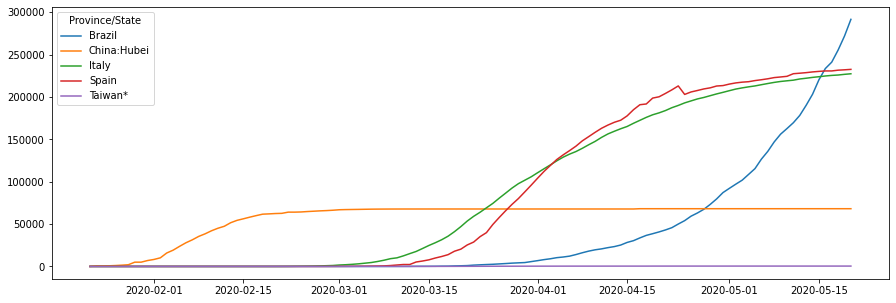

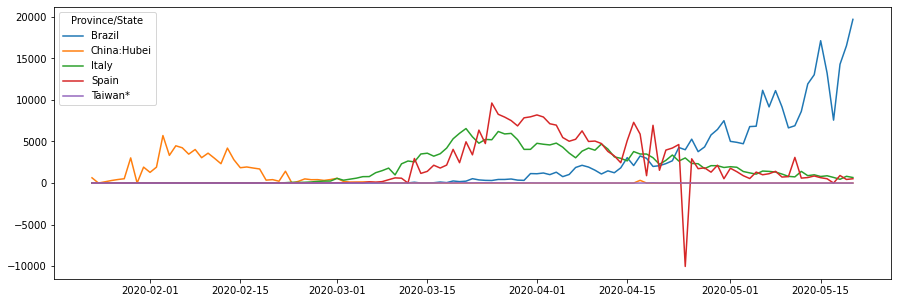

In [ ]:
# Select which countries/regions to use on the dataset
selected_regions = ['China:Hubei', 'Taiwan*', 'Italy', 'Brazil', 'Spain']
rdf = who_df.loc[:, who_df.columns.str.contains(r'|'.join(selected_regions))]

print('Total number of places (Province/State/Country/Region): ' + str(len(rdf.columns)))
rdf.plot(figsize=(15, 5))
rdf.diff().fillna(axis=1, method='ffill').plot(figsize=(15, 5))

## Loading JHU-US Data


In [ ]:
df = pd.read_csv('time_series_covid19_confirmed_US.csv')
# Replace unkown province/state with the country name
# df['Province_State'] = df.Combined_Key.apply(lambda key: ':'.join(key.split(',')[::-1]))
df['Province_State'] = df.Country_Region + ':' + df.Province_State
df.fillna({'Province_State': df['Country_Region']}, inplace=True)
us_df = df.groupby('Province_State').sum().iloc[:, 11:].T.astype(np.float32)
us_df.index = pd.to_datetime(us_df.index).date

beg_index = pd.date_range(who_df.index[0], us_df.first_valid_index() - pd.DateOffset(1)).date
beg_zero_df = pd.DataFrame(np.zeros([len(beg_index), len(us_df.columns)]),
                columns=us_df.columns,
                index=beg_index)

us_df = pd.concat([beg_zero_df, us_df], axis=0)
us_df

Province_State,US:Alabama,US:Alaska,US:American Samoa,US:Arizona,US:Arkansas,US:California,US:Colorado,US:Connecticut,US:Delaware,US:Diamond Princess,US:District of Columbia,US:Florida,US:Georgia,US:Grand Princess,US:Guam,US:Hawaii,US:Idaho,US:Illinois,US:Indiana,US:Iowa,US:Kansas,US:Kentucky,US:Louisiana,US:Maine,US:Maryland,US:Massachusetts,US:Michigan,US:Minnesota,US:Mississippi,US:Missouri,US:Montana,US:Nebraska,US:Nevada,US:New Hampshire,US:New Jersey,US:New Mexico,US:New York,US:North Carolina,US:North Dakota,US:Northern Mariana Islands,US:Ohio,US:Oklahoma,US:Oregon,US:Pennsylvania,US:Puerto Rico,US:Rhode Island,US:South Carolina,US:South Dakota,US:Tennessee,US:Texas,US:Utah,US:Vermont,US:Virgin Islands,US:Virginia,US:Washington,US:West Virginia,US:Wisconsin,US:Wyoming
2020-01-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-16,11674.0,388.0,0.0,13666.0,4578.0,78725.0,21633.0,36703.0,7547.0,49.0,7042.0,44811.0,37212.0,103.0,154.0,639.0,2419.0,92457.0,27280.0,14328.0,7939.0,7688.0,34117.0,1648.0,37968.0,84933.0,50538.0,14969.0,11123.0,10959.0,468.0,10220.0,6813.0,3556.0,145089.0,5847.0,348232.0,18130.0,1848.0,21.0,27474.0,5237.0,3612.0,65185.0,2589.0,12434.0,8661.0,3959.0,17263.0,47452.0,7068.0,934.0,69.0,29683.0,18288.0,1470.0,12187.0,741.0
2020-05-17,11771.0,388.0,0.0,13945.0,4759.0,80166.0,21938.0,37419.0,7670.0,49.0,7123.0,45588.0,37579.0,103.0,154.0,640.0,2419.0,94191.0,27778.0,14651.0,7953.0,7688.0,34432.0,1687.0,38804.0,86010.0,51142.0,15668.0,11296.0,11108.0,468.0,10177.0,6949.0,3596.0,146504.0,5938.0,350121.0,18673.0,1900.0,21.0,27923.0,5310.0,3623.0,65700.0,2646.0,12674.0,8816.0,3987.0,17359.0,48396.0,7238.0,940.0,69.0,30388.0,18433.0,1492.0,12543.0,754.0
2020-05-18,12086.0,388.0,0.0,14208.0,4813.0,81457.0,22202.0,38116.0,7869.0,49.0,7270.0,46442.0,38283.0,103.0,154.0,640.0,2455.0,96485.0,28255.0,14955.0,8303.0,7935.0,34709.0,1713.0,39762.0,87052.0,51915.0,16372.0,11432.0,11242.0,470.0,10625.0,7061.0,3652.0,148240.0,6096.0,351371.0,19207.0,1931.0,21.0,28454.0,5398.0,3687.0,66669.0,2710.0,12795.0,8942.0,4027.0,18011.0,49177.0,7384.0,940.0,69.0,31140.0,18611.0,1502.0,12687.0,766.0
2020-05-19,12376.0,400.0,0.0,14576.0,4923.0,83752.0,22482.0,38430.0,8037.0,49.0,7434.0,46944.0,38855.0,103.0,154.0,641.0,2455.0,98030.0,28705.0,15296.0,8353.0,8069.0,35038.0,1741.0,41546.0,87925.0,52350.0,17029.0,11704.0,11393.0,471.0,10854.0,7096.0,3721.0,149356.0,6192.0,352845.0,19239.0,1994.0,21.0,28952.0,5489.0,3726.0,67311.0,2805.0,12951.0,9056.0,4085.0,18412.0,50552.0,7518.0,944.0,69.0,32145.0,18811.0,1502.0,12885.0,776.0


Total number of places (Province/State/Country/Region): 1


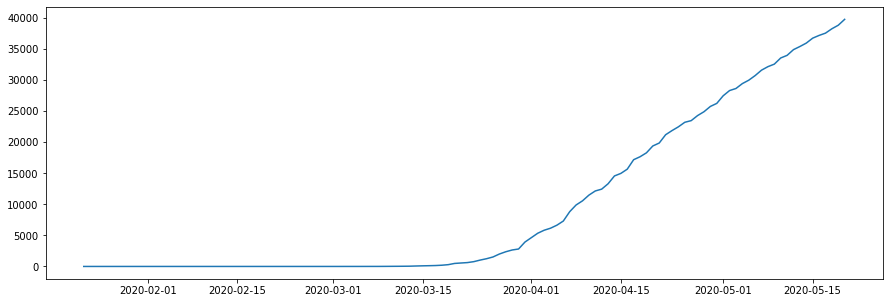

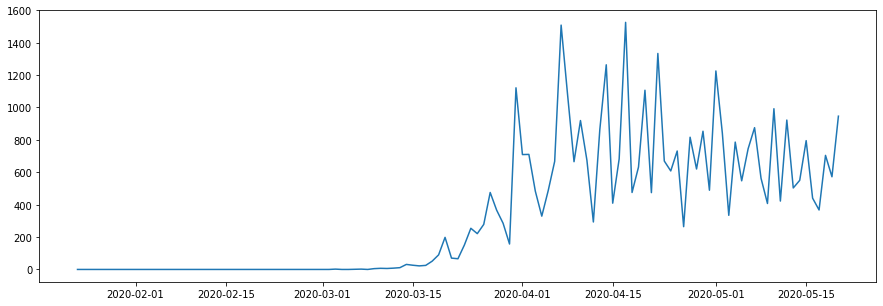

In [ ]:
# Select which countries/regions to use on the dataset
selected_regions = ['Georgia']
rdf = us_df.loc[:, us_df.columns.str.contains(r'|'.join(selected_regions))]

print('Total number of places (Province/State/Country/Region): ' + str(len(rdf.columns)))
rdf.plot(figsize=(15, 5), legend=False)
rdf.diff().fillna(axis=1, method='ffill').plot(figsize=(15, 5), legend=False)

## Load Brazil Data

In [ ]:
#Using MS data
# Run download_button.click() again if arquivo_geral.csv does not exist
bdf_ms = pd.read_csv('cases-brazil-states.csv')
bdf_ms.date = pd.to_datetime(bdf_ms.date, format="%Y/%m/%d").dt.date
bdf_ms.index = bdf_ms.date
states = bdf_ms['state'].unique()
dates = bdf_ms.date.drop_duplicates()
bdf_ms

,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,totalCasesMS,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,deaths_by_totalCases,recovered,suspects,tests,tests_per_100k_inhabitants
date,,,,,,,,,,,,,,,,,
2020-02-25,2020-02-25,Brazil,SP,TOTAL,0,0,1,1,0,0,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
2020-02-25,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1,0,0,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
2020-02-26,2020-02-26,Brazil,SP,TOTAL,0,0,0,1,0,1,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
2020-02-26,2020-02-26,Brazil,TOTAL,TOTAL,0,0,0,1,0,1,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
2020-02-27,2020-02-27,Brazil,SP,TOTAL,0,0,0,1,0,1,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-21,2020-05-21,Brazil,SC,TOTAL,4,98,111,5610,98,5610,1.36780,78.29960,0.01747,3170.0,130.0,29518.0,411.98707
2020-05-21,2020-05-21,Brazil,SE,TOTAL,7,76,457,4734,76,4734,3.30622,205.94285,0.01605,1318.0,NaN,9409.0,409.31902
2020-05-21,2020-05-21,Brazil,SP,TOTAL,195,5558,3880,73739,5558,73739,12.10391,160.58477,0.07537,1524.0,147991.0,35600.0,77.52774


(121, 28)


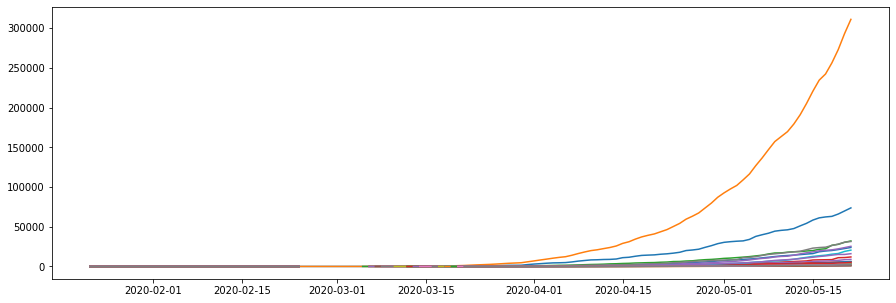

In [ ]:
br_df = pd.DataFrame(index=dates, columns=states)
for state in states:
    br_df[state] = bdf_ms[bdf_ms.state == state]['newCases'].cumsum()

br_df.columns = ['Brazil:' + s for s in br_df.columns]

beg_index = pd.date_range(who_df.index[0], br_df.first_valid_index() - pd.DateOffset(1)).date
beg_zero_df = pd.DataFrame(np.zeros([len(beg_index), len(br_df.columns)]),
                columns=br_df.columns,
                index=beg_index)
br_df = pd.concat([beg_zero_df, br_df], axis=0)

print(br_df.shape)
br_df.plot(figsize=(15, 5), legend=False)

## Load Italy Data

In [ ]:
ddf = pd.read_json('dpc-covid19-ita-regioni.json')
posdf = ddf[['denominazione_regione', 'lat', 'long']].drop_duplicates()
regions = ddf.denominazione_regione.unique()
ddf.data = pd.to_datetime(ddf.data).dt.date
ddf.set_index(ddf.data)
dates = ddf.data.unique()


it_df = pd.DataFrame(index=np.arange(len(dates)), columns=regions)
for region in regions:
    it_df[region] = ddf[ddf.denominazione_regione == region]['nuovi_positivi'].cumsum().values

it_df.index = dates
it_df.columns = ['Italy:' + s for s in it_df.columns]

beg_index = pd.date_range(who_df.index[0], it_df.first_valid_index() - pd.DateOffset(1)).date
beg_zero_df = pd.DataFrame(np.zeros([len(beg_index), len(it_df.columns)]),
                columns=it_df.columns,
                index=beg_index)
it_df = pd.concat([beg_zero_df, it_df], axis=0)

(121, 21)


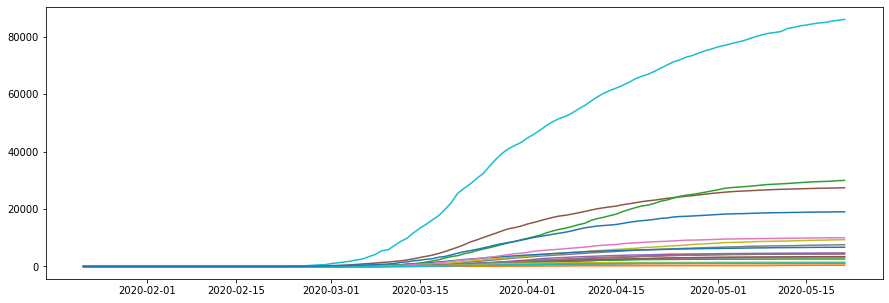

In [ ]:
it_df.plot(figsize=(15, 5), legend=False)
print(it_df.shape)

# Concatenate Data

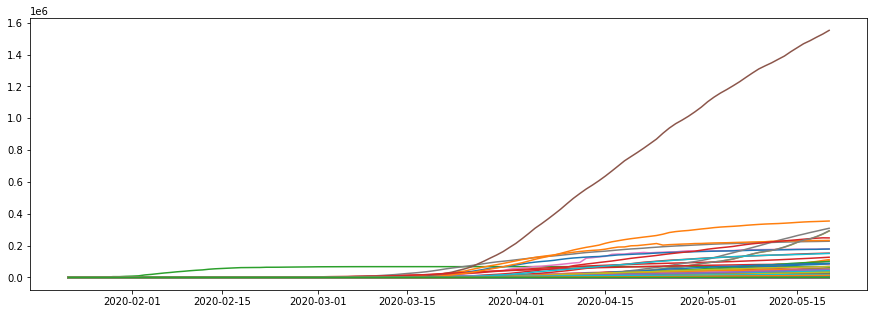

In [ ]:
last_valid_index = min([df.last_valid_index() for df in [who_df, br_df, it_df, us_df]])
sdf = pd.concat([who_df, br_df, it_df, us_df], axis=1).astype(np.float32)
sdf = sdf.loc[:last_valid_index, :]
# sdf = sdf.loc[:pd.to_datetime('2020-05-17'), :]

sdf.plot(figsize=(15,5), legend=False)

# Get Data Function

In [ ]:
# Normalize data by the day of the first case
def normalize_by_day_of_first_case(sdf):
    date_index = pd.DatetimeIndex(sdf.index)
    day_of_first_case = sdf.ne(0).idxmax()
    shifts = []
    for region in sdf.columns:
        shift_index = np.where(sdf.index == day_of_first_case[region])[0][0]
        sdf[region] = sdf[region].shift(-1 * shift_index, fill_value=np.nan) #sdf[region][-1])
        shifts.append(shift_index)

    sdf.index = np.arange(len(sdf.index))
    shifts_df = pd.DataFrame(np.expand_dims(np.array(shifts), 0), columns=sdf.columns)
    return sdf, day_of_first_case

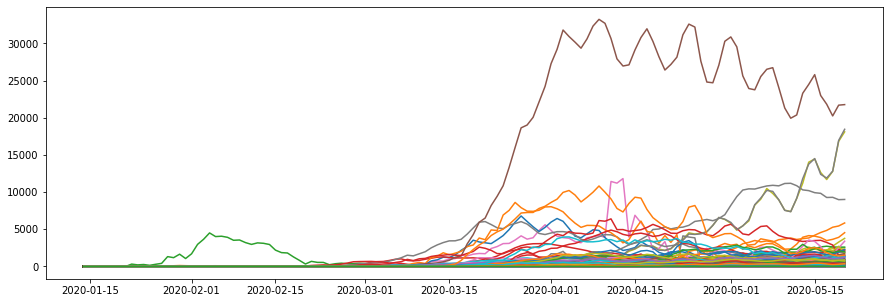

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def get_data(df, regions=['China'], partial_match=False, pad_start=None, pad_end=None, normalization=None, average_size=1, normalize_by_first_case=False, include_reverse=False):
    # Select which countries/regions to use on the dataset
    if regions:
        if partial_match:
            data = df.loc[:, df.columns.str.contains(r'|'.join(regions))]
        else:
            regions = [reg for reg in regions if reg in df]
            data = df.loc[:, regions]
    else:
        data = df
    

    # Differentiate to obtain daily cases
    # data = data.diff(axis=0).astype(np.float32)
    # data = data.diff(axis=0).fillna(0.0).astype(np.float32)
    data = data.diff(axis=0).fillna(data).astype(np.float32)

    # Moving Average
    # data = data.rolling(average_size, min_periods=1).mean() #.fillna(data)
    data = data.rolling(average_size, min_periods=1, win_type=None, center=True).mean() #.fillna(data)
    # data = data.ewm(span=average_size, ignore_na=True, min_periods=1).mean() #.fillna(data) 

    data = data.where(data > 0, 0.0)

    if pad_start:
        # Pad the Begging and End of data
        beg_index = pd.date_range(data.index[0] - pd.DateOffset(pad_start), data.index[0] - pd.DateOffset(1)).date
        beg_zero_df = pd.DataFrame(np.zeros([len(beg_index), len(data.columns)]),
                        columns=data.columns,
                        index=beg_index)
        data = pd.concat([beg_zero_df, data], axis=0)
        
    if pad_end:
        end_index = pd.date_range(data.index[-1] + pd.DateOffset(1), data.index[-1] + pd.DateOffset(pad_end)).date
        end_zero_df = pd.DataFrame(np.nan * np.ones([len(end_index), len(data.columns)]),
                        columns=data.columns,
                        index=end_index)
        
        data = pd.concat([data, end_zero_df], axis=0)
    
    # Normalizing
    scaler = None
    if normalization == 'MinMax':
        scaler = MinMaxScaler()
        data[data.columns] = scaler.fit_transform(data[data.columns])
    if normalization == 'Standard':
        scaler = StandardScaler()
        data[data.columns] = scaler.fit_transform(data[data.columns])

    if normalize_by_first_case:
        data = normalize_by_day_of_first_case(data)[0]
    
    if include_reverse:
        rev = data[::-1]
        rev.columns = [c + ':REV' for c in rev.columns]
        rev.index = rev.index[::-1]
        data = pd.concat([data, rev], axis=1)

    return data, scaler

data, _ = get_data(sdf, regions=None, pad_start=8, pad_end=None, normalization=None, average_size=3, normalize_by_first_case=False, include_reverse=False)
data.plot(figsize=(15, 5), legend=False)

# Loading Clusters from Joris

In [ ]:
clusters_df = pd.read_csv('clusters_all.csv')
clusters_df.columns = ['Country', 'Cluster', 'Date']
clusters_df = clusters_df[clusters_df.Country != 'China']
clusters_df.Country.unique()

array(['Albania', 'Algeria', 'Andorra', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Australia',
       'Australia:Australian Capital Territory',
       'Australia:New South Wales', 'Australia:Northern Territory',
       'Australia:Queensland', 'Australia:South Australia',
       'Australia:Tasmania', 'Australia:Victoria',
       'Australia:Western Australia', 'Austria', 'Azerbaijan', 'Bahamas',
       'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Bolivia',
       'Bosnia and Herzegovina', 'Brazil', 'Brazil:AC', 'Brazil:AL',
       'Brazil:AM', 'Brazil:AP', 'Brazil:BA', 'Brazil:CE', 'Brazil:DF',
       'Brazil:ES', 'Brazil:GO', 'Brazil:MA', 'Brazil:MG', 'Brazil:MS',
       'Brazil:MT', 'Brazil:PA', 'Brazil:PB', 'Brazil:PE', 'Brazil:PI',
       'Brazil:PR', 'Brazil:RJ', 'Brazil:RN', 'Brazil:RO', 'Brazil:RR',
       'Brazil:RS', 'Brazil:SC', 'Brazil:SE', 'Brazil:SP', 'Brazil:TO',
       'Brunei', 'Bulgaria', 'Cabo Verde', 'Cameroon', 'Canada',
       'Canada:Alberta', 'Canada:B

## Get Most Advanced Countries per Cluster

In [ ]:
nclusters = 5 # clusters_df.Cluster.max() + 1
ncountries = 10
group_by_clusters = clusters_df.groupby('Cluster')
adv_countries_per_cluster = []
countries_per_cluster = []


for cluster_idx in range(nclusters):
    cls = group_by_clusters.get_group(cluster_idx)
    # sorted_countries = sdf.loc[:, sdf.columns.str.contains(r'|'.join(cls[~cls.Country.str.contains('Brazil')].Country))].max().sort_values(ascending=False)
    data_adv, _ = get_data(sdf, regions=list(cls[~cls.Country.str.contains('Brazil')].Country), 
                           pad_start=8, average_size=14, normalize_by_first_case=False)
    diff_last_max = data_adv.max() - data_adv.iloc[-1, :]
    sorted_countries = diff_last_max.sort_values(ascending=False)
    adv_countries_per_cluster.append(sorted_countries.iloc[:ncountries].index.values)
    countries_per_cluster.append(cls)

countries_per_cluster_df = pd.DataFrame(countries_per_cluster).T
adv_countries_per_cluster_df = pd.DataFrame(adv_countries_per_cluster).T
adv_countries_per_cluster_df

,0,1,2,3,4
0,Japan,China:Hubei,US:New Jersey,US:Nebraska,Germany
1,Singapore,US:Massachusetts,Switzerland,Morocco,United Kingdom
2,China:Hong Kong,Israel,Austria,Slovakia,Canada:Alberta
3,Ghana,Russia,US:Pennsylvania,Ukraine,US:Colorado
4,Jamaica,Serbia,Portugal,Cuba,Italy:Lazio
5,Honduras,Canada:Ontario,US:Connecticut,Uzbekistan,US:Kansas
6,West Bank and Gaza,Australia:New South Wales,US:Florida,Tunisia,Italy:Umbria
7,Sao Tome and Principe,US:Iowa,US:Washington,Bulgaria,Australia:Victoria
8,Guinea-Bissau,Italy:Campania,Canada:Quebec,Philippines,Croatia
9,Georgia,Malaysia,Italy:Toscana,Kazakhstan,Australia:Queensland


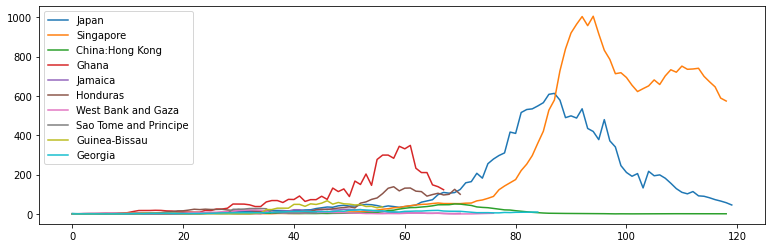

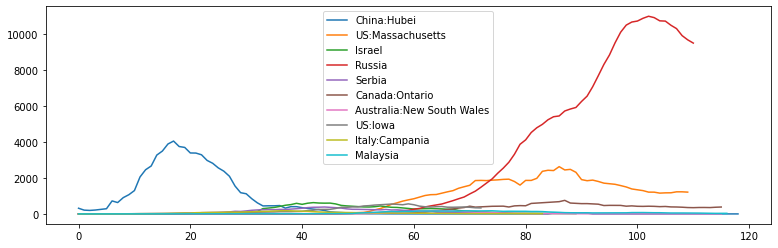

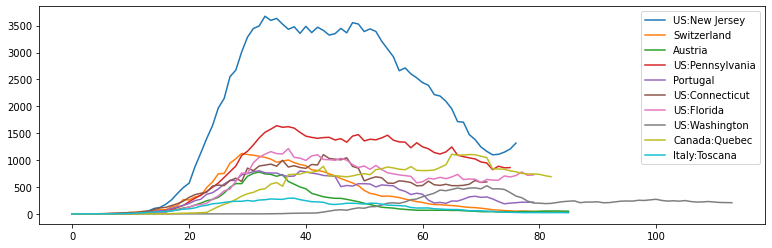

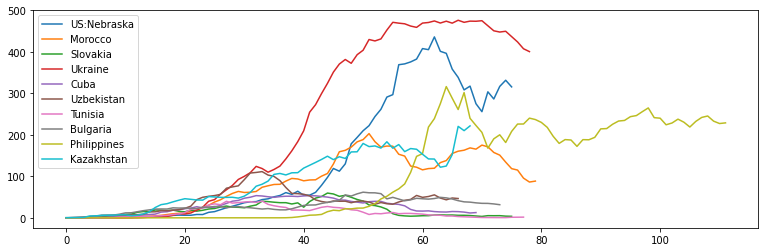

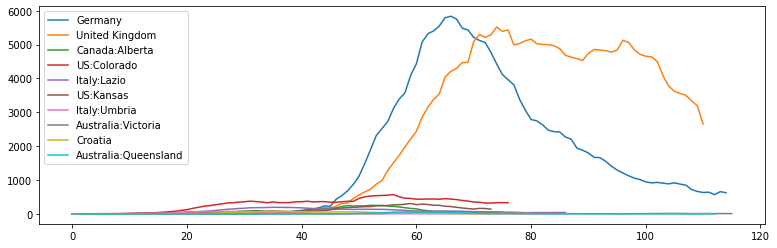

In [ ]:
for countries in adv_countries_per_cluster:
    data_adv, _ = get_data(sdf, regions=[str(reg) for reg in countries], pad_start=8, average_size=7, normalize_by_first_case=True)
    data_adv.plot(figsize=(13,4), legend=True)

## Get Brazil States per Cluster

In [ ]:
br_states_per_cluster = []
for cluster_idx in range(nclusters):
    cls = group_by_clusters.get_group(cluster_idx)
    br_states = cls[cls.Country.str.contains('Brazil:')].Country.unique()
    br_states_per_cluster.append(br_states)

br_states_per_cluster_df = pd.DataFrame(br_states_per_cluster).T
br_states_per_cluster_df

,0,1,2,3,4
0,Brazil:MG,Brazil:AP,Brazil:DF,Brazil:AL,Brazil:AC
1,Brazil:MS,Brazil:CE,Brazil:RN,Brazil:BA,Brazil:AM
2,Brazil:SE,Brazil:MA,None,Brazil:ES,Brazil:RR
3,Brazil:TO,Brazil:PA,None,Brazil:GO,None
4,None,Brazil:PE,None,Brazil:MT,None
5,None,Brazil:RJ,None,Brazil:PB,None
6,None,Brazil:SP,None,Brazil:PI,None
7,None,None,None,Brazil:PR,None
8,None,None,None,Brazil:RO,None
9,None,None,None,Brazil:RS,None


# Modified Auto-Encoder, MAE

## Sequences Generation

In [ ]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

class MAEtsGenerator(TimeseriesGenerator):
    def __init__(self, *args, **kwargs):
        self.norm = kwargs.pop('normalization')
        super(MAEtsGenerator, self).__init__(*args, **kwargs)

    def __getitem__(self, index):
        samples, targets = super().__getitem__(index)
        samples = np.reshape(np.transpose(samples, [0, 2, 1]), [-1, self.length])
        targets = np.reshape(np.expand_dims(targets, -1), [-1, 1])

        # Normalizing
        if self.norm == 'Standard':
            S = samples.std(axis=1, keepdims=True)
            M = samples.mean(axis=1, keepdims=True)
            samples = np.divide(samples - M, S, out=np.zeros_like(samples), where=S!=0)
            targets = np.divide(targets - M, S, out=np.zeros_like(targets), where=S!=0)

        if self.norm == 'DivMean':
            MS = samples.mean(axis=1, keepdims=True)
            samples = np.divide(samples, MS, out=np.zeros_like(samples), where=MS!=0)
            targets = np.divide(targets, MS, out=np.zeros_like(targets), where=MS!=0)
        
        if self.norm == 'DivMax':
            MS = samples.max(axis=1, keepdims=True)
            samples = np.divide(samples, MS, out=np.zeros_like(samples), where=MS!=0)
            targets = np.divide(targets, MS, out=np.zeros_like(targets), where=MS!=0)

        if self.norm == 'MinMax':
            max = samples.max(axis=1, keepdims=True)
            min = samples.min(axis=1, keepdims=True)
            minmaxdiff = max - min
            samples = np.divide(samples - min, minmaxdiff, out=np.zeros_like(samples), where=minmaxdiff!=0)
            targets = np.divide(targets - min, minmaxdiff, out=np.zeros_like(targets), where=minmaxdiff!=0)
        return samples, [samples, targets]

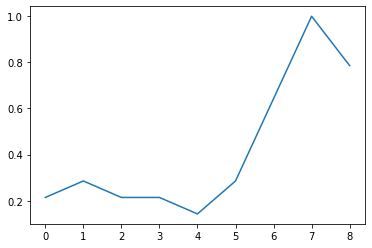

In [ ]:
def get_sequence_generator(data, normalization='DivMean', length=8, shuffle=True, batch_size=1):
    generator = MAEtsGenerator(data.values, data.values, length=length, batch_size=batch_size, normalization=normalization, shuffle=shuffle)
    return generator

generator = get_sequence_generator(data, normalization='DivMax', shuffle=False)
train_exs = 0
for i, (x, y) in enumerate(generator):
    train_exs += 1

x, y = generator[55]
plt.plot(np.concatenate([x[0,:], y[1][0]]))

## Training Loop

In [ ]:
import os
# os.environ['TF_KERAS'] = '1'
# from keras_radam import RAdam

def train(model, train_generator, eval_generator, lr=1e-3, epochs=100, weights=[1.0, 10.0], loss='mean_squared_error'):
    callbacks = [
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, verbose=0)
        # tf.keras.callbacks.ModelCheckpoint(workspace + '/Checkpoints/MAE', monitor='val_loss', save_best_only=True, verbose=0)
    ]

    model.compile(optimizer=tf.keras.optimizers.Adam(lr=lr), #RAdam(learning_rate=1e-2),
                    loss={'decoder': loss, 
                        'predictor': loss},
                    loss_weights={'decoder': weights[0],
                                'predictor': weights[1]})


    trace = model.fit(train_generator, epochs=epochs, validation_data=eval_generator, callbacks=callbacks, verbose=0)
    # tf.keras.backend.clear_session()
    return trace

## Forecasting Loop

In [ ]:
def forecast(model, generator, forecast_start_day=None, normalization='DivMean'):
    xi, yi = generator[0]

    predicted_values = np.zeros([xi.shape[0], 0])
    true_values = np.zeros([xi.shape[0], 0])

    # Iterate over a set with support data
    for i, (ex, y) in enumerate(generator):
        if forecast_start_day:
            x = ex if i < forecast_start_day else x
        else:
            x = ex if ~np.isnan(ex).any() else x
                
        # Normalize
        xi = x
        if normalization == 'Standard':
            S = x.std(axis=1, keepdims=True)
            M = x.mean(axis=1, keepdims=True)
            xi = np.divide(x - M, S, out=np.zeros_like(x), where=S!=0)
        if normalization == 'DivMean':
            M = x.mean(axis=1, keepdims=True)
            xi = np.divide(x, M, out=np.zeros_like(x), where=M!=0)
        if normalization == 'DivMax':
            M = x.max(axis=1, keepdims=True)
            xi = np.divide(x, M, out=np.zeros_like(x), where=M!=0)
        if normalization == 'MinMax':
            max = x.max(axis=1, keepdims=True)
            min = x.min(axis=1, keepdims=True)
            minmaxdiff = max - min
            xi = np.divide(x - min, minmaxdiff, out=np.zeros_like(x), where=minmaxdiff!=0)
        # Predict
        pred = model.predict(xi)[1]
        # Restore
        if normalization == 'Standard':
            pred = pred * S + M
        if normalization == 'DivMean':
            pred = pred * M
        if normalization == 'DivMax':
            pred = pred * M
        if normalization == 'MinMax':
            pred = pred * minmaxdiff + min
        # Append
        predicted_values = np.concatenate([predicted_values, pred], axis=1)
        true_values = np.concatenate([true_values, y[1]], axis=1)
        # Shift
        x = np.concatenate([x, pred], axis=1)[:, 1:]        

    return predicted_values.T, true_values.T

## Dense MAE Model

In [ ]:
# Parameters
num_models_per_cluster = 3
block_normalization = 'DivMax'
data_normalization = None #'Standard'
sequence_length = 8
latent_dim = 4
lr = 1e-2
pad_start = sequence_length
average_size = 3
seed = 100

### Defining Model

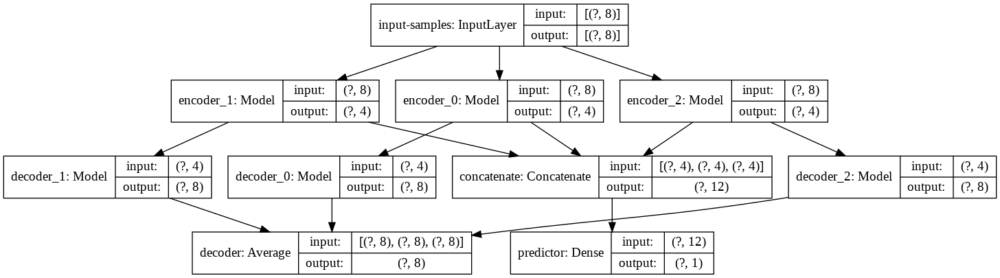

In [ ]:
def encoder(sequence_length, latent_dim, name=''):
    in_mae = tf.keras.Input(shape=(sequence_length,))
    mae = tf.keras.layers.Dense(32, activation='relu', kernel_initializer='he_uniform')(in_mae)
    mae = tf.keras.layers.Dense(latent_dim, activation='relu', kernel_initializer='he_uniform', name='latent_space')(mae)
    return tf.keras.Model(in_mae, mae, name=name)

def decoder(sequence_length, latent_dim, name=''):
    in_mae = tf.keras.Input(shape=(latent_dim,))
    mae = tf.keras.layers.Dense(32, activation='relu', kernel_initializer='he_uniform')(in_mae)
    mae = tf.keras.layers.Dense(sequence_length, activation='linear', kernel_initializer='he_uniform', name='ae_output')(mae)
    return tf.keras.Model(in_mae, mae, name=name)

def predictor(latent_dim, name=''):
    in_pred = tf.keras.Input(shape=(latent_dim,))
    pred = tf.keras.layers.Dense(1, activation='linear', name='pred_output')(in_pred)
    return tf.keras.Model(in_pred, pred, name=name)

def make_mae_dense_model(sequence_length=8, latent_dim=4, nbranch=3):
    # MAE Model 
    in_mae = tf.keras.Input(shape=(sequence_length,), name='input-samples')
    zs = [encoder(sequence_length, latent_dim, name='encoder_%d' % i)(in_mae) for i in range(nbranch)]
    maes = [decoder(sequence_length, latent_dim, name='decoder_%d' % i)(z) for i,z in enumerate(zs)]
    # preds = [predictor(latent_dim, name='predictor_%d' % i)(z) for i,z in enumerate(zs)]

    mae = tf.keras.layers.Average(name='decoder')(maes)
    pred = tf.keras.layers.Concatenate(axis=-1)(zs)
    pred = tf.keras.layers.Dense(1, activation='linear', kernel_initializer='he_uniform', name='predictor')(pred)

    mae_model = tf.keras.Model(in_mae, [mae, pred], name='MAE')
    return mae_model

tf.keras.backend.clear_session()
tf.random.set_seed(seed)
np.random.seed(seed)
models_per_cluster = [make_mae_dense_model(sequence_length, latent_dim, num_models_per_cluster) for __ in range(nclusters)]
from tensorflow.keras.utils import plot_model
plot_model(models_per_cluster[0], show_shapes=True, show_layer_names=True, to_file='model.png')

### Training

Training Cluster 0 ...
Training Cluster 1 ...
Training Cluster 2 ...
Training Cluster 3 ...
Training Cluster 4 ...


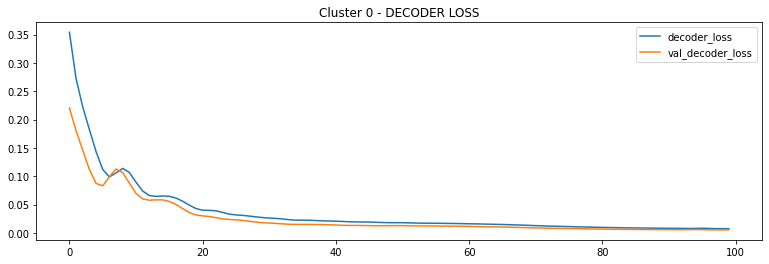

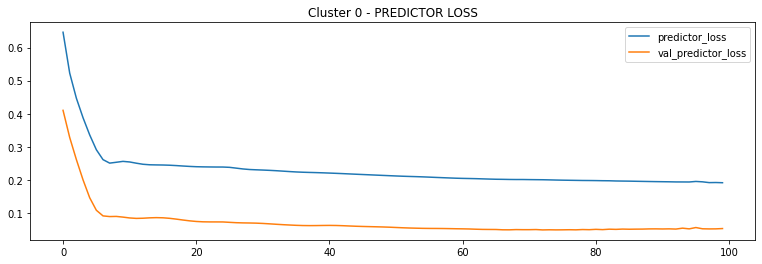

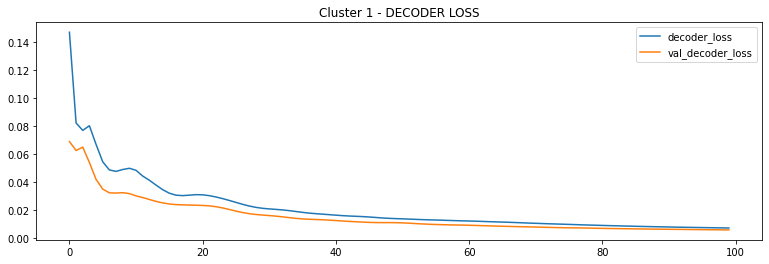

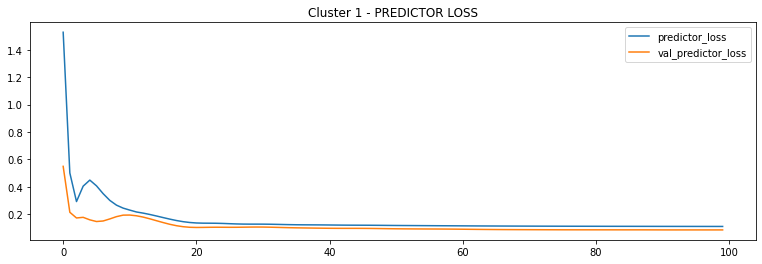

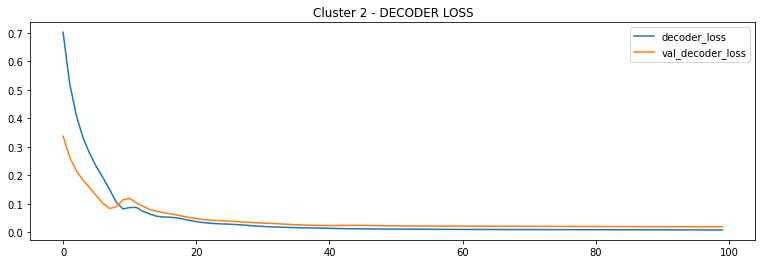

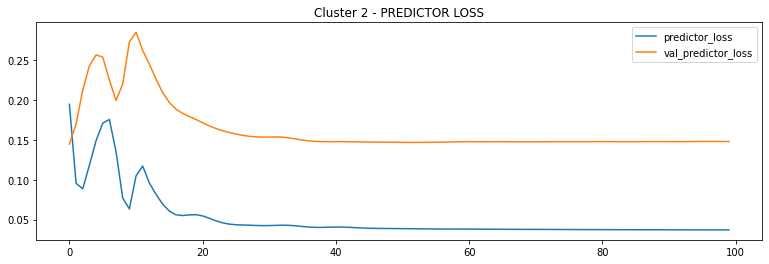

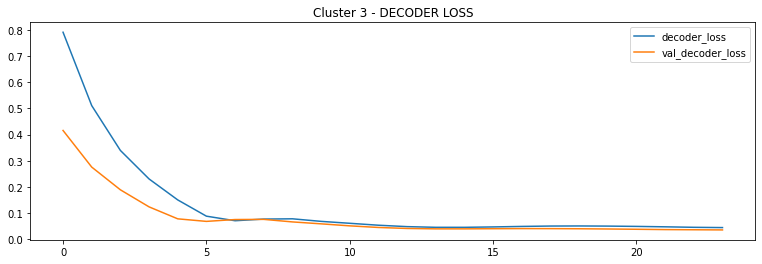

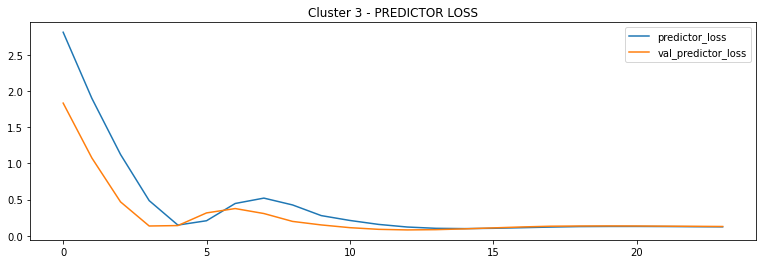

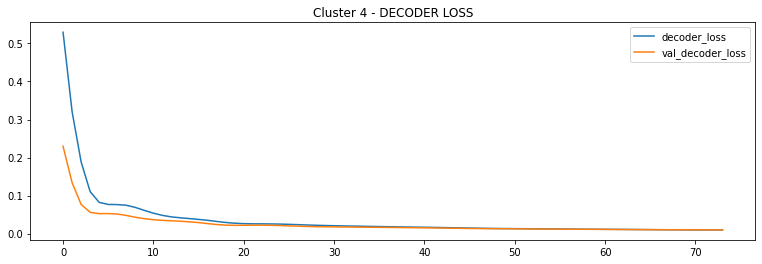

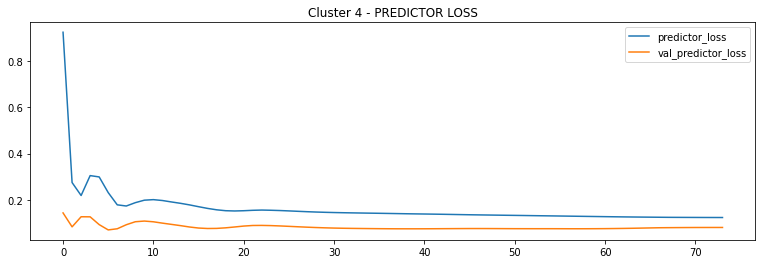

In [ ]:
for c, model in enumerate(models_per_cluster):
    print('Training Cluster %d ...' % c)
    train_cluster_regions = adv_countries_per_cluster_df.iloc[:, c]
    eval_cluster_regions = br_states_per_cluster_df.iloc[:, c]

    train_data, _ = get_data(sdf, regions=list([str(region) for region in train_cluster_regions]), 
                             pad_start=pad_start, average_size=average_size, normalization=data_normalization, normalize_by_first_case=True, 
                             include_reverse=True if c<3 else False)
    eval_data, _ = get_data(sdf, regions=list([str(region) for region in eval_cluster_regions]), 
                            pad_start=pad_start, average_size=average_size, normalization=data_normalization, normalize_by_first_case=False)
    
    train_generator = get_sequence_generator(train_data.fillna(0.0), length=sequence_length, normalization=block_normalization, shuffle=False, batch_size=512)
    eval_generator = get_sequence_generator(eval_data.fillna(0.0), length=sequence_length, normalization=block_normalization, shuffle=False, batch_size=1)

    trace = train(model, train_generator, eval_generator, lr=lr, epochs=100, weights=[4.0, 1.0], loss='mean_squared_error')

    hist = pd.DataFrame(trace.history)
    hist[['decoder_loss', 'val_decoder_loss']].plot(figsize=(13,4), title='Cluster %d - DECODER LOSS' % c)
    hist[['predictor_loss', 'val_predictor_loss']].plot(figsize=(13,4), title='Cluster %d - PREDICTOR LOSS' % c)

    # tf.keras.backend.clear_session()

### (Optional) - Load Models from files

In [ ]:
# from os import listdir
# from google.colab import drive
# drive.mount('/content/drive')
# workspace = '/content/drive/My Drive/Colab Notebooks/COVID19'
# df_folder = workspace + '/BrazilData/'
# model_folder = df_folder + '/models_trained_on_china_z4_avg3/'

# for i, model in enumerate(mae_models):
#    model.load_weights(model_folder + 'model_weights%d' % i)

## Forecasting 

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.nanmean(np.divide(np.abs(y_true - y_pred), y_true, out=np.ones_like(y_true) * np.nan, where=y_true!=0), axis=0) * 100

In [ ]:
days_ahead = 150
forecast_start_date = None # '2020-04-30' #forecast_data.last_valid_index()
forecast_average_size = 14
stats_df_per_cluster = []

predicted_df_per_cluster = []
trues_df_per_cluster = []
for c, (d, model) in enumerate(zip([1, 0, 2, 3, 4], models_per_cluster)):
    print ('Forecasting Cluster %d ...' % c)
    forecast_regions = br_states_per_cluster_df.iloc[:, c]
    forecast_data, scaler = get_data(sdf, regions=list([str(region) for region in forecast_regions]), 
                                     normalization=data_normalization, pad_start=pad_start, pad_end=days_ahead, 
                                     average_size=forecast_average_size, normalize_by_first_case=False)

    forecast_start_day = np.where(forecast_data.index == pd.to_datetime(forecast_start_date))[0][0] - pad_start if forecast_start_date else None
    forecast_generator = get_sequence_generator(forecast_data, length=sequence_length, normalization=None, shuffle=False, batch_size=1)
    preds, trues = forecast(model, forecast_generator, forecast_start_day=forecast_start_day, normalization=block_normalization)
    
    predicted_df = pd.DataFrame(preds, columns=forecast_data.columns, index=forecast_data.index[sequence_length:])
    trues_df = pd.DataFrame(trues, columns=forecast_data.columns, index=forecast_data.index[sequence_length:])

    mape = pd.DataFrame(np.expand_dims(mean_absolute_percentage_error(trues_df.values, predicted_df.values), axis=0),
                        columns = trues_df.columns)

    corr = predicted_df.corrwith(trues_df)
    stats = pd.DataFrame(np.concatenate([mape.T.values, np.expand_dims(corr.values, -1)], axis=1), columns=['MAPE', 'XCOR'], index=corr.index)

    predicted_df_per_cluster.append(predicted_df)
    trues_df_per_cluster.append(trues_df)
    stats_df_per_cluster.append(stats)

stats_df = pd.concat(stats_df_per_cluster)
all_predicted_df = pd.concat(predicted_df_per_cluster, axis=1)
all_trues_df = pd.concat(trues_df_per_cluster, axis=1)
print(stats_df)
print(stats_df.mean())

Forecasting Cluster 0 ...
Forecasting Cluster 1 ...
Forecasting Cluster 2 ...
Forecasting Cluster 3 ...
Forecasting Cluster 4 ...
                MAPE      XCOR
Brazil:MG  12.880446  0.998221
Brazil:MS  12.231206  0.997058
Brazil:SE  15.310621  0.998642
Brazil:TO  18.435331  0.996666
Brazil:AP  22.879428  0.996204
Brazil:CE  10.534147  0.996654
Brazil:MA  13.184220  0.998955
Brazil:PA  11.951267  0.998838
Brazil:PE  12.745252  0.998593
Brazil:RJ   9.910146  0.995106
Brazil:SP  11.226280  0.997867
Brazil:DF  11.028234  0.998915
Brazil:RN  28.170577  0.995068
Brazil:AL  26.092831  0.998016
Brazil:BA  12.874787  0.995686
Brazil:ES  18.184224  0.998417
Brazil:GO  14.580111  0.994085
Brazil:MT  12.533773  0.998621
Brazil:PB  17.420015  0.999444
Brazil:PI  15.907388  0.999047
Brazil:PR  16.909650  0.995414
Brazil:RO  16.331975  0.997350
Brazil:RS  13.788957  0.990497
Brazil:SC  14.635272  0.989574
Brazil:AC  15.740754  0.997760
Brazil:AM  19.599435  0.999093
Brazil:RR  18.038111  0.998233
MA

### Ploting

mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental’: File exists
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/Figures’: File exists


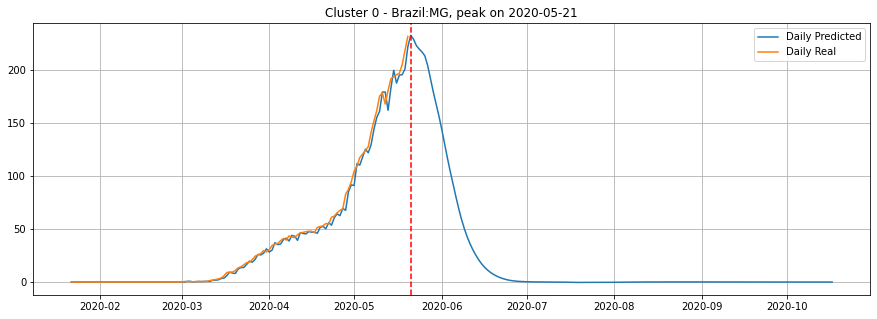

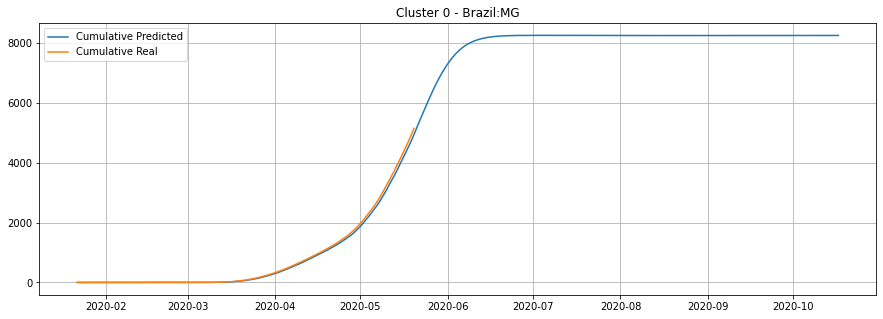

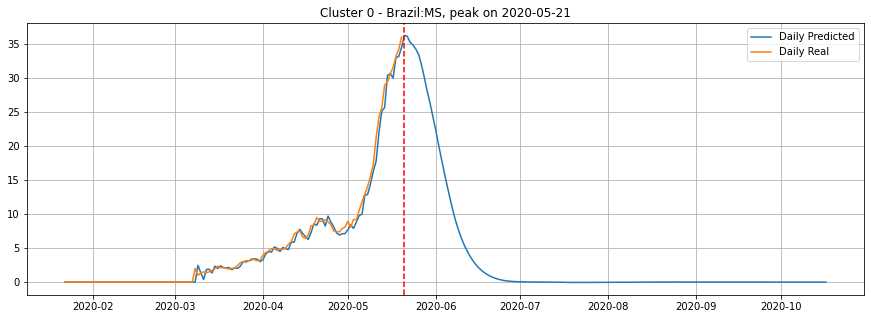

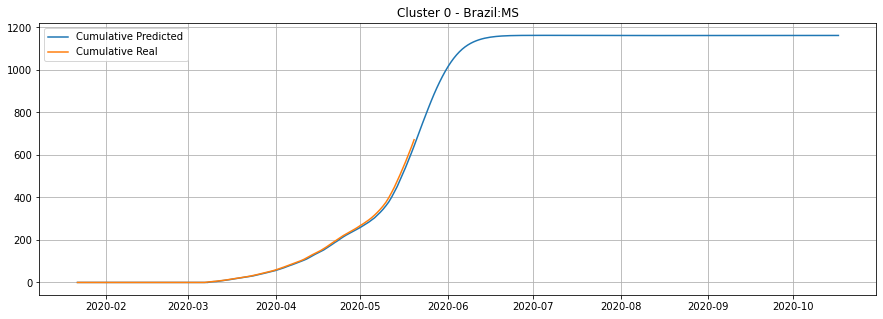

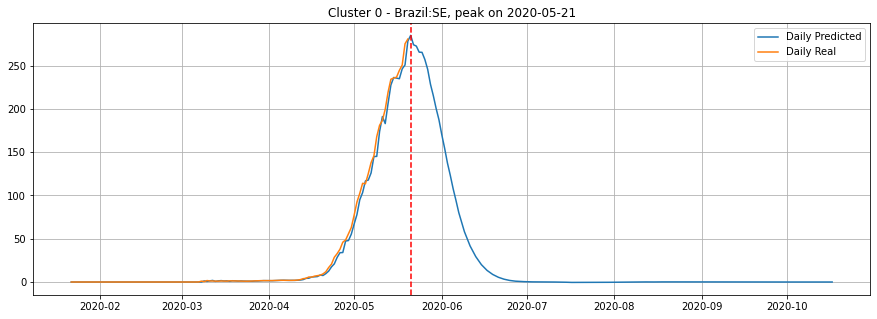

...

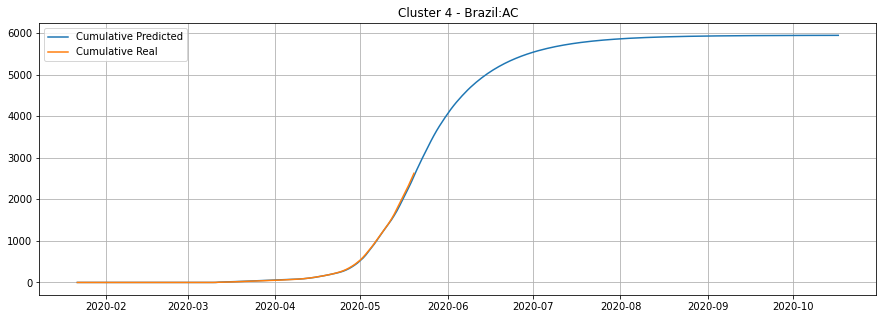

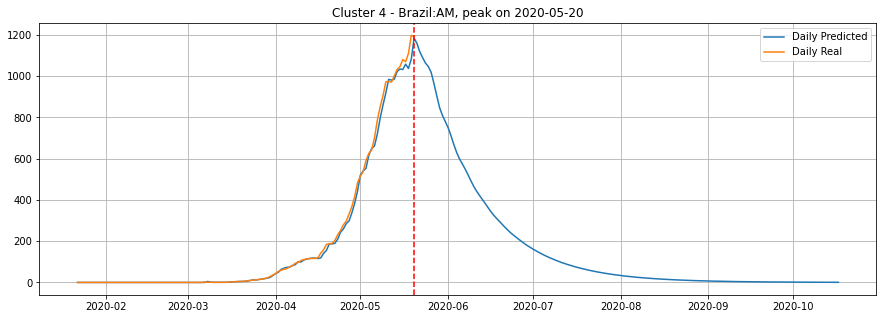

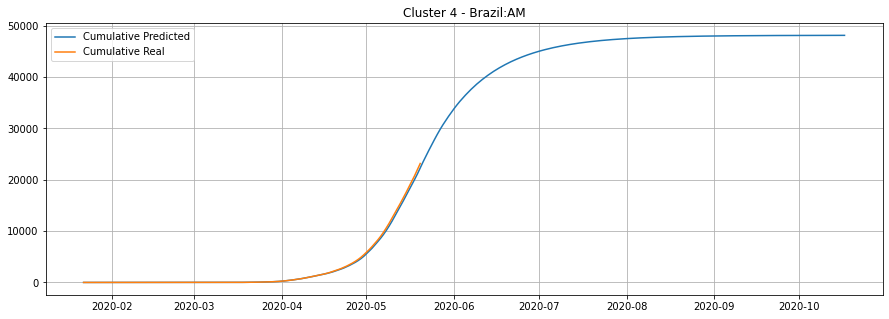

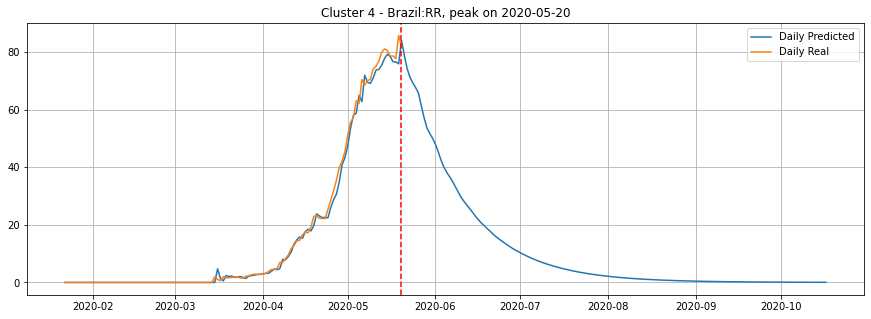

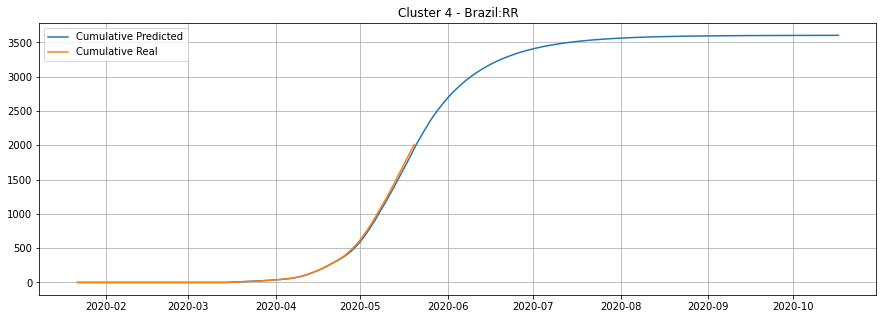

In [ ]:
workspace = '/content/drive/My Drive/Colab Notebooks/COVID19'
df_folder = workspace + '/BrazilData/Clustered_vFF-20052020-avg9-experimental'
!mkdir "{df_folder}"
!mkdir "{df_folder}/Figures"

peaks_df_per_cluster = []
total_df_per_cluster = []
for c, (predicted_df, trues_df) in enumerate(zip(predicted_df_per_cluster, trues_df_per_cluster)):
    peaks_df_per_cluster.append(predicted_df.idxmax())
    total_df_per_cluster.append(predicted_df.cumsum().max())
    for region in predicted_df.columns:
        pd.DataFrame(np.stack([predicted_df[region].values, trues_df[region].values], axis=1), 
                    columns=['Daily Predicted', 'Daily Real'], 
                     index=predicted_df.index).plot(title='Cluster %d - %s, peak on %s' % (c, region, predicted_df[region].idxmax()), 
                                                    figsize=(15,5), grid=True)
        plt.axvline(x=predicted_df[region].idxmax(), color='r', linestyle='--')
        plt.savefig(df_folder + '/Figures/Daily - %s' % region.replace(':','-'), dpi=300)

        pd.DataFrame(np.stack([predicted_df[region].cumsum().values, trues_df[region].cumsum().values], axis=1), 
                    columns=['Cumulative Predicted', 'Cumulative Real'], 
                     index=predicted_df.index).plot(title='Cluster %d - %s' % (c, region), 
                                                    figsize=(15,5), grid=True)
        plt.savefig(df_folder + '/Figures/Cum - %s' % region.replace(':','-'), dpi=300)

peaks_df = pd.concat(peaks_df_per_cluster)
total_df = pd.concat(total_df_per_cluster)
total97_df = all_predicted_df.cumsum()[all_predicted_df.cumsum() > 0.97 * total_df].idxmin()

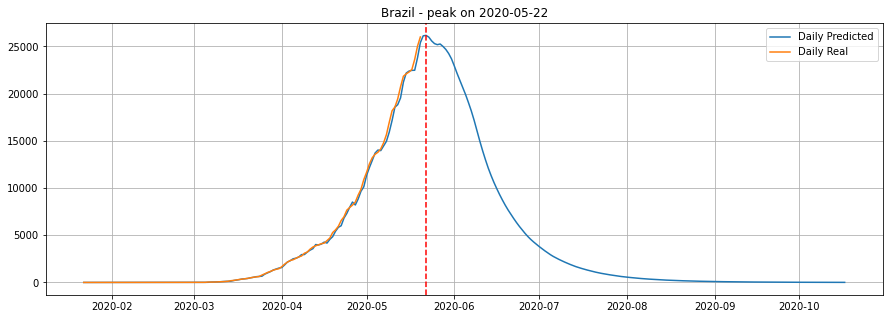

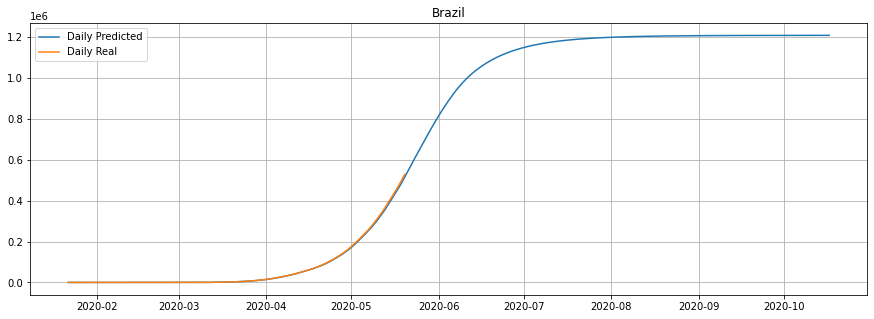

In [ ]:
sumed_pred_df = all_predicted_df.drop('Brazil:PA', axis=1).sum(axis=1)
sumed_true_df = all_trues_df.drop('Brazil:PA', axis=1).sum(axis=1, min_count=1)
pd.DataFrame(np.stack([sumed_pred_df.values, sumed_true_df.values], axis=1), 
                    columns=['Daily Predicted', 'Daily Real'], 
                     index=predicted_df.index).plot(title='Brazil - peak on %s' % sumed_pred_df.idxmax(),
                                                    figsize=(15,5), grid=True)
plt.axvline(x=sumed_pred_df.idxmax(), color='r', linestyle='--')
plt.savefig(df_folder + '/Figures/Daily Brazil', dpi=300)
                     

pd.DataFrame(np.stack([sumed_pred_df.cumsum().values, sumed_true_df.cumsum().values], axis=1), 
                    columns=['Daily Predicted', 'Daily Real'], 
                     index=predicted_df.index).plot(title='Brazil',
                                                    figsize=(15,5), grid=True)
plt.savefig(df_folder + '/Figures/Cum Brazil', dpi=300)

all_predicted_df['Brazil'] = sumed_pred_df
all_trues_df['Brazil'] = sumed_true_df

# sdf.loc[:, sdf.columns.str.contains(r'Brazil:')].diff().sum(axis=1).rolling(15, center=True).mean().plot()
# all_predicted_df['Brazil'].plot()
# all_trues_df['Brazil'].plot()


### Interactive Plotting

In [ ]:
#Required code to run plotly
configure_plotly_browser_state()
py.init_notebook_mode(connected=False)
# !mkdir "{df_folder}/Figures/Interactive"

for predicted_df, trues_df in zip(predicted_df_per_cluster, trues_df_per_cluster):
    for region in predicted_df.columns:
        fig = pd.DataFrame(np.stack([predicted_df[region].values, trues_df[region].values], axis=1), 
                    columns=['Daily Predicted', 'Daily Real'], index=predicted_df.index).iplot(title=region)
        # fig.write_html(df_folder + '/Figures/Interactive/Daily - %s.html' % region.replace(':','-'))

        fig = pd.DataFrame(np.stack([predicted_df[region].cumsum().values, trues_df[region].cumsum().values], axis=1), 
                    columns=['Cumulative Predicted', 'Cumulative Real'], index=predicted_df.index).iplot(title=region)
        # fig.write_html(df_folder + '/Figures/Interactive/Cum - %s.html' % region.replace(':','-'))

## Save Data and Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

peaks_df.to_csv(df_folder + '/peaks.csv')
total_df.to_csv(df_folder + '/total.csv')
total97_df.to_csv(df_folder + '/total97.csv')
stats_df.to_csv(df_folder + '/stats.csv')
all_predicted_df.to_csv(df_folder + '/predictions.csv')
all_trues_df.to_csv(df_folder + '/references.csv')

for c in range(nclusters):
    cluster_folder = df_folder + '/cluster_' + str(c)
    !mkdir "{cluster_folder}"
    models_per_cluster[c].save_weights(cluster_folder + '/model')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/cluster_0’: File exists
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/cluster_1’: File exists
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/cluster_2’: File exists
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/cluster_3’: File exists
mkdir: cannot create directory ‘/content/drive/My Drive/Colab Notebooks/COVID19/BrazilData/Clustered_vFF-20052020-avg9-experimental/cluster_4’: File exists


# Generate Report

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# workspace = '/content/drive/My\ Drive/Colab\ Notebooks/COVID19/BrazilData/'
# nb_name = 'COVID19\ Time\ Series\ -\ Clustered'
# !cp {workspace + nb_name} .
# !jupyter nbconvert  {nb_name}